# Evaluate U-Net Models on Singlecoil Knee fastMRI

In [1]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [65]:
import os, sys
sys.path.append('/content/drive/MyDrive/fastMRI')

In [66]:
%cd /content/drive/MyDrive/fastMRI
!pip install -r requirements.txt

/content/drive/MyDrive/fastMRI


## Import Libraries and Set Paths

In [ ]:
import torch
import random
import numpy as np
from pathlib import Path
from collections import defaultdict
from tqdm import tqdm

from fastmri.pl_modules import UnetModule, AttUnetModuleCenterWeighted
from fastmri.data import SliceDataset
from fastmri.data.transforms import UnetDataTransform
import fastmri

ckpt_path = None
test_path = None
output_path = None
device = None

def get_paths(leaderboard="knee_sc_leaderboard", log_path="/content/drive/My Drive/fastMRI/logs/unet/"):
    global ckpt_path, test_path, output_path, device
    model_path = log_path + leaderboard
    ckpt_path = Path(f"{model_path}/checkpoints/epoch=49-step=198250.ckpt")
    test_path = Path("/content/drive/My Drive/fastMRI/data/singlecoil_test")
    output_path = Path(f"{model_path}/reconstructions")
    output_path.mkdir(parents=True, exist_ok=True)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

## Baseline U-Net Model

### Load Model from Checkpoint

In [5]:
model = UnetModule.load_from_checkpoint(str(ckpt_path))
model.eval()
model.to(device)

UnetModule(
  (NMSE): DistributedMetricSum()
  (SSIM): DistributedMetricSum()
  (PSNR): DistributedMetricSum()
  (ValLoss): DistributedMetricSum()
  (TotExamples): DistributedMetricSum()
  (TotSliceExamples): DistributedMetricSum()
  (unet): Unet(
    (down_sample_layers): ModuleList(
      (0): ConvBlock(
        (layers): Sequential(
          (0): Conv2d(1, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (1): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
          (2): LeakyReLU(negative_slope=0.2, inplace=True)
          (3): Dropout2d(p=0.0, inplace=False)
          (4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (5): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
          (6): LeakyReLU(negative_slope=0.2, inplace=True)
          (7): Dropout2d(p=0.0, inplace=False)
        )
      )
      (1): ConvBlock(
        (layers): Se

### Load Test Set
- Using the 90% of the validation set that was untouched during training.

In [19]:
# Set the seed
seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)

test_transform = UnetDataTransform("singlecoil")
val_dataset = SliceDataset(
    root=test_path,
    transform=test_transform,
    challenge="singlecoil",
    volume_sample_rate=0.1,
    use_dataset_cache=True
)

used_filenames = set(example[4] for example in val_dataset)

full_val_dataset = SliceDataset(
    root=test_path,
    transform=test_transform,
    challenge="singlecoil",
    use_dataset_cache=True
)

test_dataset = [example for example in full_val_dataset if example[4] not in used_filenames]

test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=1, num_workers=4)

### Evaluate Model on Test Set

In [20]:
reconstructions = defaultdict(list)

for batch in tqdm(test_loader, desc="Reconstructing"):
    image = batch.image.to(device)  # shape: (1, 1, H, W)
    mean = batch.mean.unsqueeze(1).unsqueeze(2).to(device)
    std = batch.std.unsqueeze(1).unsqueeze(2).to(device)

    with torch.no_grad():
        output = model(image).cpu().squeeze(1)  # (B, H, W)

    output = (output * std.cpu() + mean.cpu()).numpy()
    for i in range(output.shape[0]):
        fname = batch.fname[i]
        slice_num = int(batch.slice_num[i].cpu())
        reconstructions[fname].append((slice_num, output[i]))

Reconstructing: 100%|██████████| 6441/6441 [04:05<00:00, 26.26it/s]


### Save Reconstruction Images

In [21]:
for fname in reconstructions:
    slices = sorted(reconstructions[fname], key=lambda x: x[0])
    stacked = np.stack([s[1] for s in slices])
    reconstructions[fname] = stacked

fastmri.save_reconstructions(reconstructions, output_path)
print(f"Saved reconstructions to {output_path}")

Saved reconstructions to /content/drive/My Drive/fastMRI/logs/unet/knee_sc_leaderboard/test/reconstructions


### Visualize Reconstruction Image

Available keys: ['reconstruction']
Loaded 38 slices.


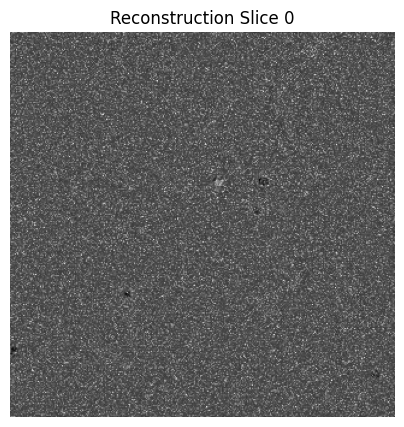

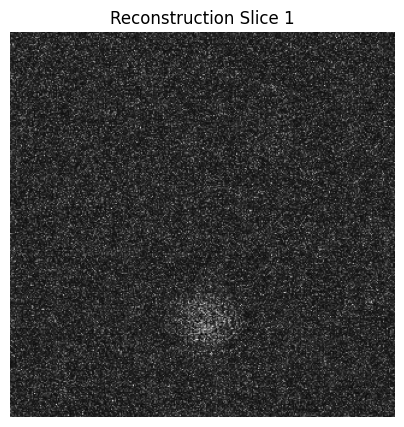

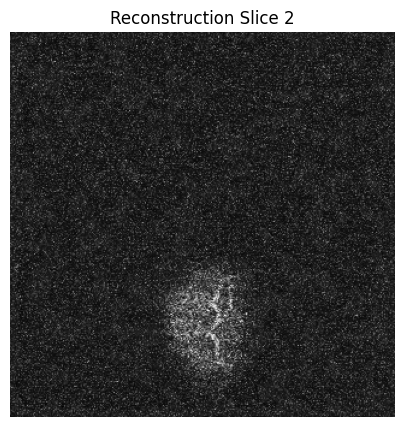

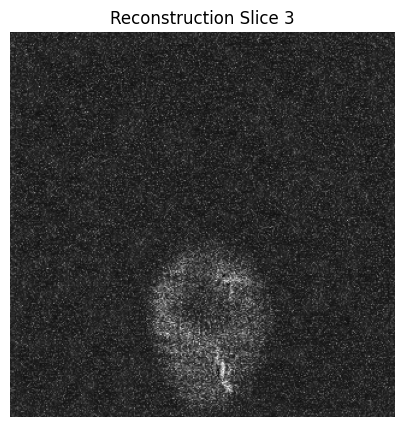

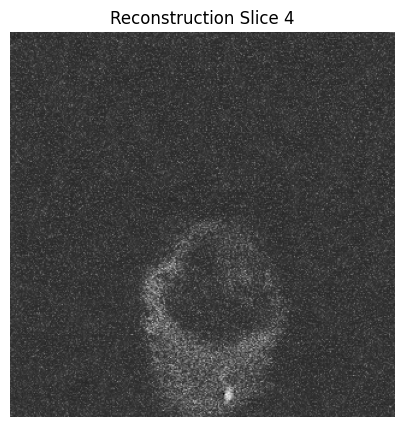

...

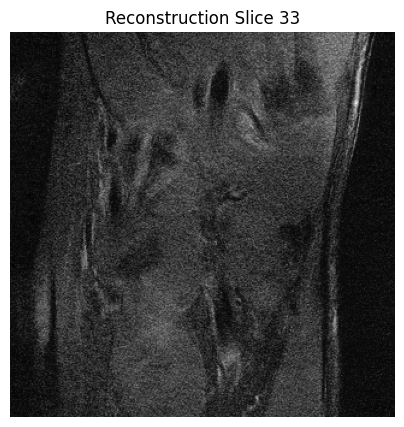

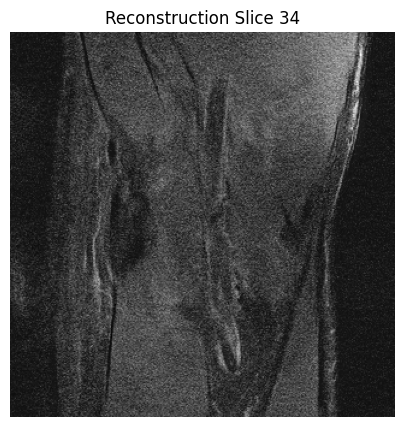

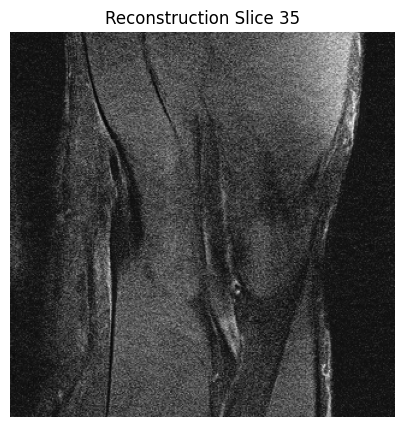

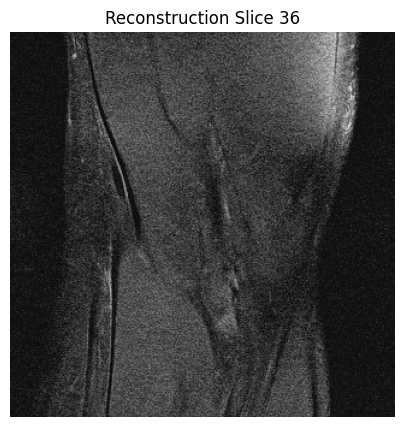

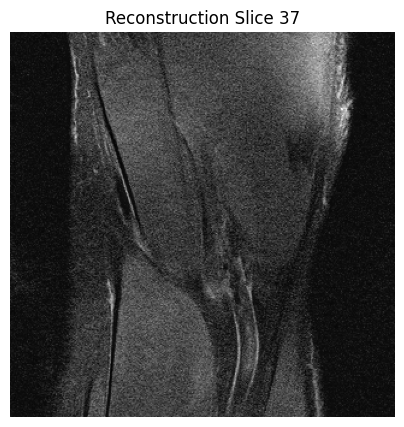

In [22]:
import h5py
import numpy as np
import matplotlib.pyplot as plt

# Path to your reconstruction file
file_path = os.path.join(output_path, "file1000007.h5")

# Open the file
with h5py.File(file_path, "r") as hf:
    print("Available keys:", list(hf.keys()))
    recon = hf["reconstruction"][:]  # Shape: (num_slices, height, width)

# Plot some slices
num_slices = recon.shape[0]
print(f"Loaded {num_slices} slices.")

for i in range(num_slices):
    image = recon[i]
    plt.figure(figsize=(5, 5))
    plt.imshow(image, cmap="gray")
    plt.title(f"Reconstruction Slice {i}")
    plt.axis("off")
    plt.show()

## Center-weighted Loss U-Net Model

In [ ]:
get_paths(leaderboard="knee_sc_leaderboard_center_weighted_loss")

In [55]:
model = UnetModule.load_from_checkpoint(str(ckpt_path))
model.eval()
model.to(device)

UnetModule(
  (NMSE): DistributedMetricSum()
  (SSIM): DistributedMetricSum()
  (PSNR): DistributedMetricSum()
  (ValLoss): DistributedMetricSum()
  (TotExamples): DistributedMetricSum()
  (TotSliceExamples): DistributedMetricSum()
  (unet): Unet(
    (down_sample_layers): ModuleList(
      (0): ConvBlock(
        (layers): Sequential(
          (0): Conv2d(1, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (1): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
          (2): LeakyReLU(negative_slope=0.2, inplace=True)
          (3): Dropout2d(p=0.0, inplace=False)
          (4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (5): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
          (6): LeakyReLU(negative_slope=0.2, inplace=True)
          (7): Dropout2d(p=0.0, inplace=False)
        )
      )
      (1): ConvBlock(
        (layers): Se

In [26]:
reconstructions = defaultdict(list)

for batch in tqdm(test_loader, desc="Reconstructing"):
    image = batch.image.to(device)  # shape: (1, 1, H, W)
    mean = batch.mean.unsqueeze(1).unsqueeze(2).to(device)
    std = batch.std.unsqueeze(1).unsqueeze(2).to(device)

    with torch.no_grad():
        output = model(image).cpu().squeeze(1)  # (B, H, W)

    output = (output * std.cpu() + mean.cpu()).numpy()
    for i in range(output.shape[0]):
        fname = batch.fname[i]
        slice_num = int(batch.slice_num[i].cpu())
        reconstructions[fname].append((slice_num, output[i]))

Reconstructing: 100%|██████████| 6441/6441 [04:12<00:00, 25.49it/s]


In [27]:
for fname in reconstructions:
    slices = sorted(reconstructions[fname], key=lambda x: x[0])
    stacked = np.stack([s[1] for s in slices])
    reconstructions[fname] = stacked

fastmri.save_reconstructions(reconstructions, output_path)
print(f"Saved reconstructions to {output_path}")

Saved reconstructions to /content/drive/My Drive/fastMRI/logs/unet/knee_sc_leaderboard_center_weighted_loss/test/reconstructions


## Attention U-Net

In [ ]:
get_paths(leaderboard="knee_sc_leaderboard_AttUnet_center_weighted_loss")

In [71]:
model = AttUnetModuleCenterWeighted.load_from_checkpoint(str(ckpt_path))
model.eval()
model.to(device)

AttUnetModuleCenterWeighted(
  (NMSE): DistributedMetricSum()
  (SSIM): DistributedMetricSum()
  (PSNR): DistributedMetricSum()
  (ValLoss): DistributedMetricSum()
  (TotExamples): DistributedMetricSum()
  (TotSliceExamples): DistributedMetricSum()
  (unet): AttUnet(
    (down_sample_layers): ModuleList(
      (0): ConvBlock(
        (layers): Sequential(
          (0): Conv2d(1, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (1): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
          (2): LeakyReLU(negative_slope=0.2, inplace=True)
          (3): Dropout2d(p=0.0, inplace=False)
          (4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (5): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
          (6): LeakyReLU(negative_slope=0.2, inplace=True)
          (7): Dropout2d(p=0.0, inplace=False)
        )
      )
      (1): ConvBlock(


In [72]:
reconstructions = defaultdict(list)

for batch in tqdm(test_loader, desc="Reconstructing"):
    image = batch.image.to(device)  # shape: (1, 1, H, W)
    mean = batch.mean.unsqueeze(1).unsqueeze(2).to(device)
    std = batch.std.unsqueeze(1).unsqueeze(2).to(device)

    with torch.no_grad():
        output = model(image).cpu().squeeze(1)  # (B, H, W)

    output = (output * std.cpu() + mean.cpu()).numpy()
    for i in range(output.shape[0]):
        fname = batch.fname[i]
        slice_num = int(batch.slice_num[i].cpu())
        reconstructions[fname].append((slice_num, output[i]))

Reconstructing: 100%|██████████| 6441/6441 [04:30<00:00, 23.78it/s]


In [73]:
for fname in reconstructions:
    slices = sorted(reconstructions[fname], key=lambda x: x[0])
    stacked = np.stack([s[1] for s in slices])
    reconstructions[fname] = stacked

fastmri.save_reconstructions(reconstructions, output_path)
print(f"Saved reconstructions to {output_path}")

Saved reconstructions to /content/drive/My Drive/fastMRI/logs/unet/knee_sc_leaderboard_AttUnet_center_weighted_loss (1)/test/reconstructions
